<a href="https://colab.research.google.com/github/socialx-analytics/bi-02-okt-25/blob/main/001_SNA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
# Install required libraries
import subprocess
import sys

packages = ["networkx", "matplotlib", "pandas"]

for package in packages:
    subprocess.check_call([sys.executable, "-m", "pip", "install", package, "--quiet"])

print("All packages installed successfully!")

All packages installed successfully!


In [6]:
# Import all required libraries

import pandas as pd
import re
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import greedy_modularity_communities

In [7]:
# Load tweet dataset

# Read the CSV file from GitHub
url = "https://raw.githubusercontent.com/apriandito/bi-20-june/refs/heads/main/tweet_digitalcurrency_text.csv"
df = pd.read_csv(url).head(1000)

# Display the first 5 rows
df.head(5)

# Display column names
df.columns.tolist()

# Display dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   created_at      1000 non-null   object
 1   screen_name     1000 non-null   object
 2   text            1000 non-null   object
 3   favorite_count  1000 non-null   int64 
 4   retweet_count   1000 non-null   int64 
dtypes: int64(2), object(3)
memory usage: 39.2+ KB


In [8]:
# Create edgelist from mentions (who mentions whom)

# Create empty list to store edges
edge_list = []

# Loop through each tweet in the DataFrame
for index, row in df.iterrows():
    try:
        # Get the username of the tweet author
        account_name = row["screen_name"]

        # Get the tweet text
        tweet = row["text"]

        # Convert tweet to string to handle any data type issues
        tweet = str(tweet)

        # Find all mentions in the tweet (usernames starting with @)
        mentions = re.findall(r"@(\w+)", tweet)

        # Create edges between the author and each mentioned user
        # Add @ symbol to both source and target
        edges = [(f"@{account_name}", f"@{mention}") for mention in mentions]

        # Add these edges to our edge list
        edge_list.extend(edges)
    except Exception as e:
        continue

# Convert edge list to DataFrame with source and target columns
edgelist = pd.DataFrame(edge_list, columns=["source", "target"])

# Display the edgelist
edgelist.head(10)

print(f"Total edges found: {len(edgelist)}")
edgelist

Total edges found: 1833


,source,target
0,@PapaPapag1954,@LewisECFC
1,@PapaPapag1954,@Kes1977
2,@PapaPapag1954,@herotroyippygod
3,@PapaPapag1954,@GlobeSentinels
4,@PapaPapag1954,@JP__1872
...,...,...
1828,@LouisAdimando,@naval
1829,@Waakzaam,@rocha_earl
1830,@Waakzaam,@realDonaldTrump
1831,@ohocrow,@hdtdydn


/usr/local/lib/python3.12/dist-packages/networkx/drawing/nx_pylab.py:1296: UserWarning: 

The arrowstyle keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)
/usr/local/lib/python3.12/dist-packages/networkx/drawing/nx_pylab.py:1296: UserWarning: 

The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default values.
Note that using FancyArrowPatches may be slow for large graphs.

  draw_networkx_edges(G, pos, arrows=arrows, **edge_kwds)


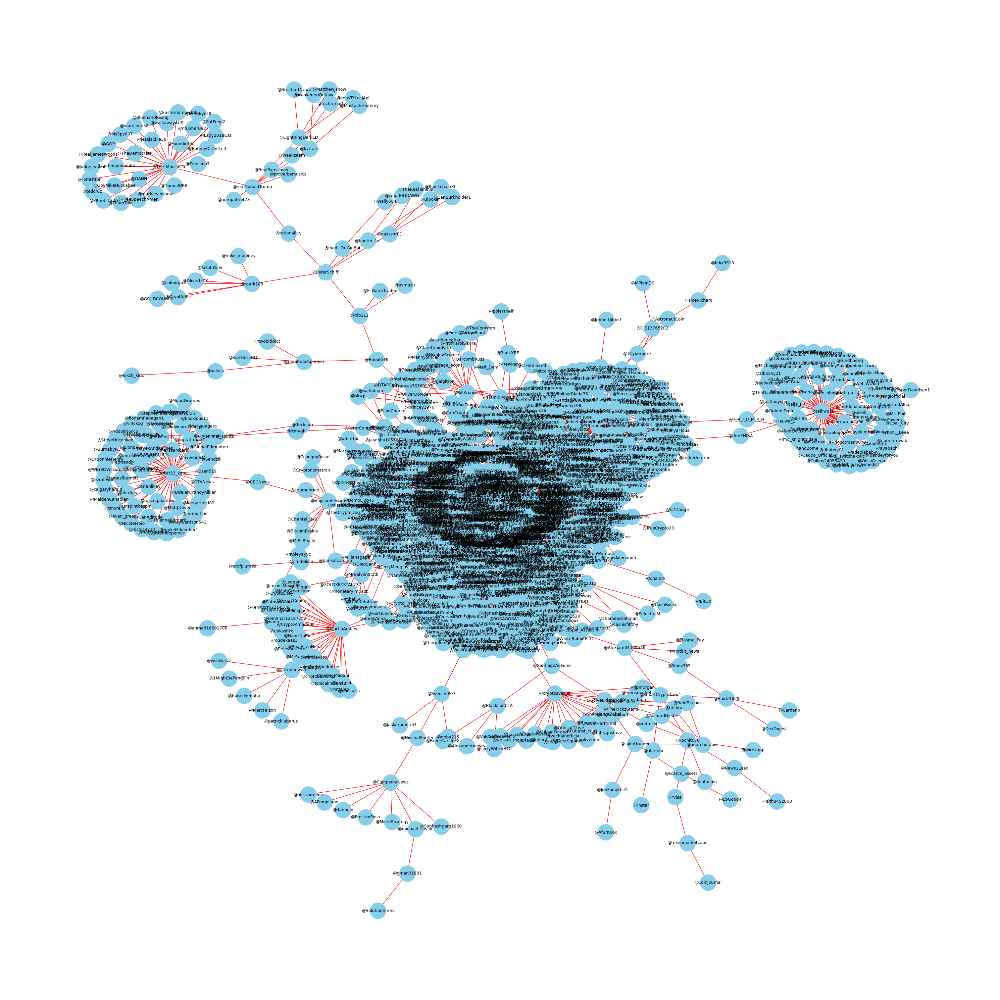

In [9]:
# Build network graph and visualize

# Construct Network from edgelist
G = nx.from_pandas_edgelist(edgelist, source="source", target="target")

# Create visualization
plt.figure(figsize=(30, 30))

# Visualize Network
nx.draw(
    G,
    with_labels=True,
    node_color="skyblue",
    node_size=1200,
    arrowstyle="->",
    arrowsize=20,
    edge_color="r",
    font_size=9,
    pos=nx.kamada_kawai_layout(G),
)
plt.show()

In [10]:
# Calculate basic network metrics

print(f"Number of Nodes: {nx.number_of_nodes(G)}")
print(f"Number of Edges: {nx.number_of_edges(G)}")
print(f"Graph Density: {nx.density(G):.4f}")

Number of Nodes: 1708
Number of Edges: 1524
Graph Density: 0.0010


In [11]:
# Calculate centrality measures

# Degree Centrality
degree = nx.degree_centrality(G)

# Top 10 nodes by Degree
sorted_degree = sorted(nx.degree(G), key=lambda x: x[1], reverse=True)[0:10]
for node, deg in sorted_degree:
    print(f"  {node}: {deg}")

# Betweenness Centrality
betweenness = nx.betweenness_centrality(G)

# Top 10 nodes by Betweenness Centrality
sorted_betweenness = sorted(
    nx.betweenness_centrality(G, normalized=True).items(),
    key=lambda x: x[1],
    reverse=True,
)[0:10]
for node, score in sorted_betweenness:
    print(f"  {node}: {score:.4f}")

# Closeness Centrality
closeness = nx.closeness_centrality(G)

# Top 10 nodes by Closeness Centrality
sorted_closeness = sorted(
    nx.closeness_centrality(G).items(), key=lambda x: x[1], reverse=True
)[0:10]
for node, score in sorted_closeness:
    print(f"  {node}: {score:.4f}")

  @GalaxyDigital11: 160
  @EUbrainwashing: 118
  @oteikwu16: 68
  @kat53_kate: 52
  @JeremyH67433698: 50
  @MartinAudley: 29
  @BarbaryBard: 29
  @The_Moccasin_: 28
  @RatesZero: 24
  @Durango96380362: 24
  @GalaxyDigital11: 0.0516
  @BAmirmojahed: 0.0327
  @aantonop: 0.0209
  @DeyeyeSeun: 0.0204
  @TheCryptoLark: 0.0203
  @oteikwu16: 0.0187
  @EUbrainwashing: 0.0186
  @dougywolfe: 0.0182
  @RaoulGMI: 0.0174
  @IAmENISA: 0.0174
  @GalaxyDigital11: 0.0616
  @binance: 0.0596
  @cz_binance: 0.0588
  @BAmirmojahed: 0.0572
  @davidgokhshtein: 0.0539
  @Moonblast78: 0.0520
  @CryptoFinally: 0.0514
  @Grayscale: 0.0513
  @cryptocom: 0.0507
  @Yield_Field_1: 0.0505


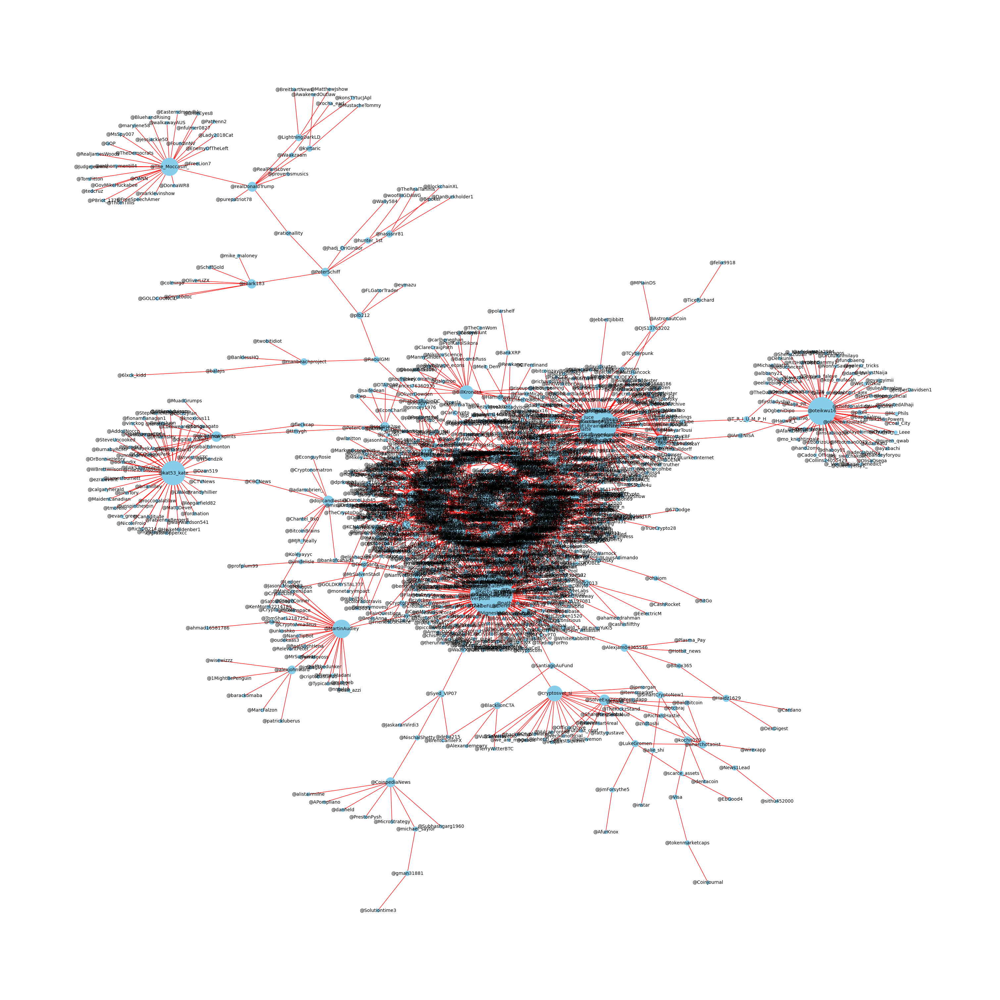

In [12]:
# Visualize network with node size based on degree

# Visualize network based on degree
plt.figure(figsize=(30, 30))

# Set Degree Dictionary
d = dict(degree)

# Convert dict_keys to list for nodelist
nodelist = list(d.keys())

# Visualize Network based on degree
nx.draw(
    G,
    with_labels=True,
    node_color="skyblue",
    nodelist=nodelist,  # Use the list instead of dict_keys
    node_size=[v * 90000 for v in d.values()],
    arrowstyle="->",
    arrowsize=20,
    edge_color="r",
    font_size=10,
    pos=nx.kamada_kawai_layout(G),
)
plt.show()

In [13]:
# Detect communities in the network

# Use greedy modularity communities for community detection
communities_m = sorted(greedy_modularity_communities(G), key=len, reverse=True)
print(f"Number of communities found: {len(communities_m)}")

# Set Node Community Function
def set_node_community(G, communities_m):
    """Add community to node attributes"""
    for c, v_c in enumerate(communities_m):
        for v in v_c:
            # Add 1 to save 0 for external edges
            G.nodes[v]["community"] = c + 1

# Set Colour Function
def get_color(i, r_off=1, g_off=1, b_off=1):
    """Assign a color to a vertex."""
    n = 16
    low, high = 0.1, 0.9
    span = high - low
    r = low + span * (((i + r_off) * 3) % n) / (n - 1)
    g = low + span * (((i + g_off) * 5) % n) / (n - 1)
    b = low + span * (((i + b_off) * 7) % n) / (n - 1)
    return (r, g, b)

# Set Node Communities
community = set_node_community(G, communities_m)

# Set Node Color
node_color = [get_color(G.nodes[v]["community"]) for v in G.nodes]

Number of communities found: 226


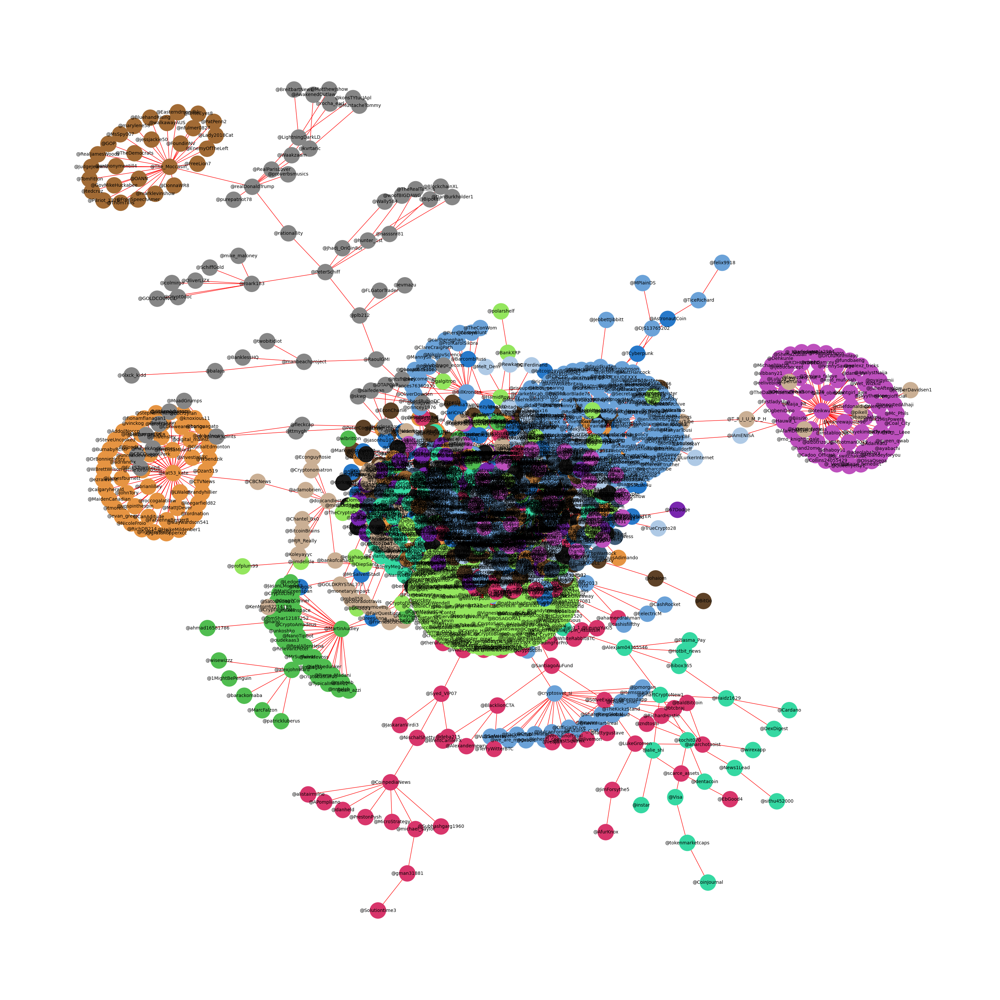

In [14]:
# Visualize network with different colors per community

# Visualize Network based on community
plt.figure(figsize=(30, 30))
nx.draw(
    G,
    with_labels=True,
    node_color=node_color,
    node_size=1200,
    arrowstyle="->",
    arrowsize=20,
    edge_color="r",
    font_size=10,
    pos=nx.kamada_kawai_layout(G),
)
plt.show()
